# 10 Nikolov TO Empirical Policy + Indirect Inference

Trade-off model pipeline: solve/load the TO policy, simulate a grid-state panel, construct observable policy-function variables, fit quadratic empirical policy functions with partial-dependence diagnostics, and estimate the structural parameters by indirect inference against the real Hong Kong Compustat panel.

In [1]:
from pathlib import Path
import os
import pickle
import sys
import time

SEED = 20260527
# Profile is env-overridable so the same notebook can be smoke-tested without
# editing: NIKOLOV_PROFILE=SMOKE jupyter nbconvert --execute ...
PROFILE_NAME = os.environ.get("NIKOLOV_PROFILE", "BASE")  # "SMOKE" or "BASE"

SOLVE_TO = True
USE_SOLVE_CACHE = False
SIMULATE_PANEL = True
FIT_POLICY = True
SAVE_FIGURES = True
FIG_DPI = 160

OUTPUT_ROOT = Path("outputs/notebooks/10_nikolov_to_policy_pipeline")

# Set to Nikolov21's estimates (Table 2). alpha/f/delta/psi/eta_bar/xi together
# with the AR(1) rho/sigma double as the indirect-inference anchor (beta_anchor);
# tau/r/kappa/theta/lambda are calibrated and held fixed during estimation.
PARAM_KWARGS = dict(
    tau=0.20,
    alpha=0.75,
    f=0.70,
    delta=0.15,
    psi=0.15,
    r=0.04,
    kappa=0.50,
    eta_bar=0.30,
    xi=0.60,
    theta=0.70,
    lambda_diversion=0.04,
)

AR1_KWARGS = dict(rho=0.80, sigma=0.30, mu=0.0, z_sd_mult=3.0)

# Deterministic grid-bound knobs shared by the display solve and the II loop.
# The single source of truth is NikolovIIConfig / build_nikolov_grid_config.
GRID_BOUNDS = dict(k_low_mult=0.10, k_high_mult=2.00, debt_fraction_of_k_ref=1.50)

# Two grid resolutions over the IDENTICAL bound/param recipe:
#   DISPLAY_GRID: a fine grid for the section-1 policy/plot (solved once).
#   II_GRID:      a coarse grid for indirect inference, which re-solves the model
#                 once per candidate beta. TO solve cost grows ~O(n_k^2 n_b^2 n_z)
#                 (15x12x5 ~ 8s, 30x30x7 ~ 25 min), so estimation must stay coarse.
# Only the resolution differs; bounds, spacing, Tauchen, and the param mapping
# are shared, so there is no hidden config/param drift (asserted below).
DISPLAY_GRID = (
    dict(n_k=30, n_b=30, n_z=7) if PROFILE_NAME == "BASE"
    else dict(n_k=10, n_b=8, n_z=4)
)
II_GRID = (
    dict(n_k=15, n_b=12, n_z=5) if PROFILE_NAME == "BASE"
    else dict(n_k=10, n_b=8, n_z=4)
)

SIMULATION_KWARGS = dict(
    n_firms=1000 if PROFILE_NAME == "BASE" else 200,
    horizon=50 if PROFILE_NAME == "BASE" else 8,
    burn_in=20 if PROFILE_NAME == "BASE" else 4,
    seed=SEED,
    default_restart=True,
)

# Indirect-inference run configuration (separate from the section-2 panel).
# Optimizer: Nelder-Mead is the primary (it makes no smoothness assumption,
# which suits the grid-discretized, piecewise-constant II objective), with a
# Powell polish (a different search geometry that refines near the optimum and
# cannot return a worse point than its Nelder-Mead start). Started from the
# midpoint of the bounds (a neutral, non-oracle initialisation, matching the SMM
# validation convention), not warm-started from beta_anchor.
II_RUN_KWARGS = dict(
    n_firms=1000 if PROFILE_NAME == "BASE" else 200,
    horizon=30 if PROFILE_NAME == "BASE" else 8,
    burn_in=20 if PROFILE_NAME == "BASE" else 4,
    n_sim_panels=64 if PROFILE_NAME == "BASE" else 6,
    optimizer_maxiter=120 if PROFILE_NAME == "BASE" else 5,
    global_method="Nelder-Mead",
    local_method="Powell",
)
# Identity-W (first-step) estimate is the headline, so beta_hat is the W=I
# estimator and stage 2 is skipped.
II_TWO_STEP = False
# Standard errors are cheap (2*K extra solves) but require Omega_hat, hence
# n_sim_panels > n_moments (27). Only BASE has enough panels; on BASE these are
# one-step sandwich (simulation-noise) SEs, not efficient/clustered SEs.
II_COMPUTE_SE = PROFILE_NAME == "BASE"
RUN_INDIRECT_INFERENCE = True

POLICY_X_COLS = ["log_k", "profitability", "leverage"]
POLICY_Y_COLS = ["investment_rate", "future_leverage", "payout_rate"]
POLICY_DEGREE = 2

if PROFILE_NAME not in {"SMOKE", "BASE"}:
    raise ValueError("PROFILE_NAME must be 'SMOKE' or 'BASE'.")

REPO_ROOT = None
for candidate in [Path.cwd(), *Path.cwd().parents]:
    if (candidate / "src" / "v2").exists():
        REPO_ROOT = candidate
        break
if REPO_ROOT is None:
    import importlib.util
    spec = importlib.util.find_spec("src.v2")
    if spec is not None and spec.origin is not None:
        REPO_ROOT = Path(spec.origin).resolve().parents[2]
if REPO_ROOT is None:
    raise RuntimeError("Could not find repo root containing src/v2.")
os.chdir(REPO_ROOT)
if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

OUTPUT_DIR = (OUTPUT_ROOT if OUTPUT_ROOT.is_absolute() else REPO_ROOT / OUTPUT_ROOT) / PROFILE_NAME
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
os.environ.setdefault("MPLCONFIGDIR", str(OUTPUT_DIR / ".mplconfig"))
Path(os.environ["MPLCONFIGDIR"]).mkdir(parents=True, exist_ok=True)

SOLUTION_PATH = OUTPUT_DIR / "to_solution.pkl"
PANEL_PATH = OUTPUT_DIR / "to_simulated_panel.csv"
COEFFICIENT_PATH = OUTPUT_DIR / "empirical_policy_coefficients.csv"
FIGURE_PATH = OUTPUT_DIR / "to_empirical_policy_slices.png"
II_RESULT_PATH = OUTPUT_DIR / "indirect_inference_result.csv"
II_OVERLAY_FIGURE_PATH = OUTPUT_DIR / "to_ii_policy_overlay.png"
REAL_PANEL_PATH = REPO_ROOT / "data" / "processed" / "nikolov_hkg_policy_panel.csv"

print(f"profile={PROFILE_NAME} seed={SEED}")
print(f"output={OUTPUT_DIR.relative_to(REPO_ROOT)}")
print(f"display grid: {DISPLAY_GRID}; II grid: {II_GRID}")
print(f"simulation={SIMULATION_KWARGS}")
print(f"II run={II_RUN_KWARGS} two_step={II_TWO_STEP} compute_se={II_COMPUTE_SE}")

profile=BASE seed=20260527
output=outputs/notebooks/10_nikolov_to_policy_pipeline/BASE
display grid: {'n_k': 30, 'n_b': 30, 'n_z': 7}; II grid: {'n_k': 15, 'n_b': 12, 'n_z': 5}
simulation={'n_firms': 1000, 'horizon': 50, 'burn_in': 20, 'seed': 20260527, 'default_restart': True}
II run={'n_firms': 1000, 'horizon': 30, 'burn_in': 20, 'n_sim_panels': 64, 'optimizer_maxiter': 120, 'global_method': 'Nelder-Mead', 'local_method': 'Powell'} two_step=False compute_se=True


In [2]:
from dataclasses import replace

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from src.v2.estimation.empirical_policy import (
    EmpiricalPolicyConfig,
    empirical_policy_coefficients,
    fit_empirical_policy,
    partial_dependence_slices,
)
from src.v2.estimation.nikolov_ii import (
    NikolovIIConfig,
    build_nikolov_grid_config,
    build_nikolov_params,
    make_nikolov_ii_target,
    pack_beta,
    run_nikolov_ii,
)
from src.v2.estimation.smm import SMMRunConfig
from src.v2.simulation.nikolov_to import (
    NikolovTOSimulationConfig,
    construct_to_observables,
    simulate_nikolov_to_panel,
)
from src.v2.solvers.nikolov_to import solve_nikolov_to

plt.rcParams.update({
    "figure.dpi": 120,
    "axes.grid": True,
    "grid.alpha": 0.25,
    "axes.spines.top": False,
    "axes.spines.right": False,
})

# Single source of truth: the II config owns the beta -> params and
# beta -> grid recipe. The display config is the same recipe at a finer
# resolution. beta_anchor packs the Table-2 estimates into the II parameter
# vector, so evaluating the II callback at beta_anchor reproduces the
# section-1 solve (up to grid resolution).
ii_cfg = NikolovIIConfig(
    fixed_params=dict(
        tau=PARAM_KWARGS["tau"],
        r=PARAM_KWARGS["r"],
        kappa=PARAM_KWARGS["kappa"],
        theta=PARAM_KWARGS["theta"],
        lambda_diversion=PARAM_KWARGS["lambda_diversion"],
    ),
    z_mu=AR1_KWARGS["mu"],
    z_sd_mult=AR1_KWARGS["z_sd_mult"],
    k_low_mult=GRID_BOUNDS["k_low_mult"],
    k_high_mult=GRID_BOUNDS["k_high_mult"],
    debt_fraction_of_k_ref=GRID_BOUNDS["debt_fraction_of_k_ref"],
    **II_GRID,
)
display_cfg = replace(ii_cfg, **DISPLAY_GRID)
beta_anchor = pack_beta(PARAM_KWARGS, AR1_KWARGS, ii_cfg)
params = build_nikolov_params(beta_anchor, ii_cfg)

# Auxiliary-regression config shared by the section-1 plot and the II loop:
# raw (unstandardized) degree-2 polynomial on raw observables so coefficients
# are comparable across panels and between data and simulation.
AUX_CONFIG = EmpiricalPolicyConfig(degree=ii_cfg.degree, standardize=ii_cfg.standardize)


def build_to_config():
    """Section-1 display grid, from the same builder the II loop uses."""
    return build_nikolov_grid_config(beta_anchor, display_cfg)


def save_figure(fig, path):
    if SAVE_FIGURES:
        fig.savefig(path, dpi=FIG_DPI, bbox_inches="tight")
        print(f"saved {path.relative_to(REPO_ROOT)}")


def finite_nondefault(df):
    cols = POLICY_X_COLS + POLICY_Y_COLS
    return df.loc[
        (~df["default"].astype(bool))
        & np.isfinite(df[cols].to_numpy(dtype=np.float64)).all(axis=1)
    ].copy()

/Users/wangzhaoxuan/Desktop/JPM-TSRL/DL_corp_finance/.venv/lib/python3.12/site-packages/keras/src/export/tf2onnx_lib.py:8: FutureWarning: In the future `np.object` will be defined as the corresponding NumPy scalar.
  if not hasattr(np, "object"):


## 1. Solve Or Load TO Policy

In [3]:
to_config = build_to_config()
print(f"TO grid: k={to_config.n_k}, b={to_config.n_b}, z={to_config.n_z}")
print(f"TO bounds: k={tuple(round(x, 4) for x in to_config.k_bounds)}, b={tuple(round(x, 4) for x in to_config.b_bounds)}, z={tuple(round(x, 4) for x in to_config.z_bounds)}")

if USE_SOLVE_CACHE and SOLUTION_PATH.exists():
    with SOLUTION_PATH.open("rb") as fh:
        to_result = pickle.load(fh)
    print(f"loaded cached solution: {SOLUTION_PATH.relative_to(REPO_ROOT)}")
elif SOLVE_TO:
    start = time.perf_counter()
    to_result = solve_nikolov_to(to_config, params)
    solve_time = time.perf_counter() - start
    with SOLUTION_PATH.open("wb") as fh:
        pickle.dump(to_result, fh)
    print(f"solved TO in {solve_time:.2f}s")
    print(f"saved solution: {SOLUTION_PATH.relative_to(REPO_ROOT)}")
else:
    raise FileNotFoundError("No cached TO solution found and SOLVE_TO=False.")

policy_gap = float(np.max(np.abs(to_result["policy"]["value"] - to_result["value"])))
print(f"value shape={to_result['value'].shape}, feasible min={to_result['feasible_action_counts'].min()}, feasible max={to_result['feasible_action_counts'].max()}")
print(f"max LP violation={to_result['diagnostics']['max_lp_violation']:.2e}, policy gap={policy_gap:.2e}")

TO grid: k=30, b=30, z=7
TO bounds: k=(19.7754, 395.5078), b=(0.0, 296.6309), z=(0.2231, 4.4817)
solved TO in 498.50s
saved solution: outputs/notebooks/10_nikolov_to_policy_pipeline/BASE/to_solution.pkl
value shape=(30, 30, 7), feasible min=499, feasible max=816
max LP violation=1.93e-08, policy gap=1.93e-08


## 2. Simulate Model Panel

In [4]:
if SIMULATE_PANEL:
    sim_config = NikolovTOSimulationConfig(**SIMULATION_KWARGS)
    start = time.perf_counter()
    panel = simulate_nikolov_to_panel(to_result, params, sim_config)
    sim_time = time.perf_counter() - start
    panel.to_csv(PANEL_PATH, index=False)
    print(f"simulated rows={len(panel):,} in {sim_time:.2f}s")
    print(f"default rate={panel['default'].mean():.2%}")
    print(f"saved panel: {PANEL_PATH.relative_to(REPO_ROOT)}")
else:
    panel = pd.read_csv(PANEL_PATH)
    print(f"loaded panel rows={len(panel):,}: {PANEL_PATH.relative_to(REPO_ROOT)}")

simulated rows=50,000 in 0.04s
default rate=5.72%
saved panel: outputs/notebooks/10_nikolov_to_policy_pipeline/BASE/to_simulated_panel.csv


## 3. Construct Observables

In [5]:
observables = construct_to_observables(panel)
fit_sample = finite_nondefault(observables)
print(f"observable rows={len(observables):,}")
print(f"non-default finite fit rows={len(fit_sample):,}")
for col in POLICY_X_COLS + POLICY_Y_COLS:
    print(f"{col}: mean={fit_sample[col].mean():.4f}, sd={fit_sample[col].std():.4f}")

observable rows=50,000
non-default finite fit rows=47,142
log_k: mean=4.7963, sd=0.6738
profitability: mean=0.3304, sd=0.1949
leverage: mean=0.7749, sd=0.3298
investment_rate: mean=0.2890, sd=0.2563
future_leverage: mean=0.8354, sd=0.2680
payout_rate: mean=0.2342, sd=0.1521


## 4. Fit Empirical Policy Functions

In [6]:
if FIT_POLICY:
    fit = fit_empirical_policy(observables, POLICY_X_COLS, POLICY_Y_COLS, AUX_CONFIG)
    coefficients = empirical_policy_coefficients(fit)
    coefficients.to_csv(COEFFICIENT_PATH, index=False)
    print(f"fit observations={fit.n_observations:,}, features={len(fit.feature_names)}")
    fit_summary = pd.DataFrame([
        dict(
            outcome=y_col,
            r2=outcome.r2,
            rmse=float(np.sqrt(np.mean(np.square(outcome.residuals)))),
            sigma2=outcome.sigma2,
            dof=outcome.dof,
            n_observations=fit.n_observations,
        )
        for y_col, outcome in fit.outcomes.items()
    ])
    FIT_SUMMARY_PATH = OUTPUT_DIR / "empirical_policy_fit_summary.csv"
    fit_summary.to_csv(FIT_SUMMARY_PATH, index=False)
    print(fit_summary.round(4).to_string(index=False))
    # Most statistically significant terms (|t| largest), as a fit-quality read.
    top = coefficients.reindex(
        coefficients["t_stat"].abs().sort_values(ascending=False).index
    ).head(12)
    print("\ntop terms by |t|:")
    print(top[["outcome", "feature", "coefficient", "std_error", "t_stat"]].round(4).to_string(index=False))
    print(f"\nsaved coefficients: {COEFFICIENT_PATH.relative_to(REPO_ROOT)}")
    print(f"saved fit summary: {FIT_SUMMARY_PATH.relative_to(REPO_ROOT)}")
else:
    raise RuntimeError("FIT_POLICY=False is not supported yet because plotting needs the fitted object.")

fit observations=47,142, features=10
        outcome     r2   rmse  sigma2   dof  n_observations
investment_rate 0.4200 0.1952  0.0381 47132           47142
future_leverage 0.9363 0.0677  0.0046 47132           47142
    payout_rate 0.2727 0.1297  0.0168 47132           47142

top terms by |t|:
        outcome                feature  coefficient  std_error   t_stat
future_leverage               leverage       1.3757     0.0096 143.7134
future_leverage             leverage^2      -0.3965     0.0050 -78.9782
investment_rate          profitability       2.9505     0.0405  72.8366
investment_rate profitability leverage      -1.3043     0.0202 -64.6002
future_leverage                      1       1.0382     0.0181  57.3937
investment_rate        profitability^2       0.9301     0.0167  55.7867
future_leverage          profitability      -0.6385     0.0140 -45.4809
future_leverage                  log_k      -0.3673     0.0087 -42.2777
investment_rate    log_k profitability      -0.4548     

## 5. Plot Empirical Policy Slices

The empirical policy function `P(x) = E[y | x]` is a regression, not a deterministic map: the observable state `x = (log k, profitability, leverage)` is a lossy, nonlinear transform of the primitive state `(k, b, z, eta)`, so `y | x` is a genuine distribution and `P` is its conditional mean.

Each panel shows a **partial-dependence** curve (red): the varied state is swept over its 2-98% range while the other states keep their observed values, averaging the fitted prediction at each grid point. The shaded band is the pointwise 95% confidence interval of that conditional mean. The natural reference is the **binned conditional mean of the data** (black dots), which the curve should track; the raw scatter is the marginal cloud across all states and is necessarily wider than any single-covariate slice.

saved outputs/notebooks/10_nikolov_to_policy_pipeline/BASE/to_empirical_policy_slices.png


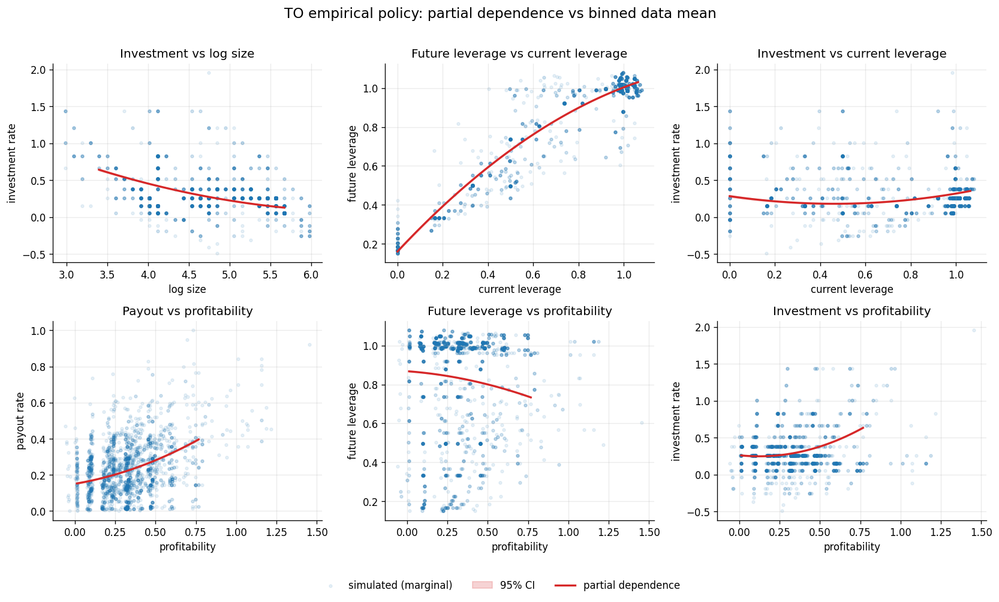

In [7]:
slice_predictions = partial_dependence_slices(
    fit,
    observables,
    POLICY_X_COLS,
    grid_size=100,
    ci_level=0.95,
    quantile_range=(0.02, 0.98),
)
plot_sample = fit_sample.sample(
    n=min(2500, len(fit_sample)),
    random_state=SEED,
) if len(fit_sample) else fit_sample

state_labels = {
    "log_k": "log size",
    "profitability": "profitability",
    "leverage": "current leverage",
}
action_labels = {
    "investment_rate": "investment rate",
    "future_leverage": "future leverage",
    "payout_rate": "payout rate",
}

comparative_statics = [
    ("investment_rate", "log_k", "Investment vs log size"),
    ("future_leverage", "leverage", "Future leverage vs current leverage"),
    ("investment_rate", "leverage", "Investment vs current leverage"),
    ("payout_rate", "profitability", "Payout vs profitability"),
    ("future_leverage", "profitability", "Future leverage vs profitability"),
    ("investment_rate", "profitability", "Investment vs profitability"),
]


def dedup_legend(axes):
    handles, labels = [], []
    for ax in np.atleast_1d(axes).ravel():
        for handle, label in zip(*ax.get_legend_handles_labels()):
            if label not in labels:
                handles.append(handle)
                labels.append(label)
    return handles, labels


fig, axes = plt.subplots(2, 3, figsize=(14, 8.4))
for ax, (y_col, x_col, title) in zip(axes.ravel(), comparative_statics):
    ax.scatter(
        plot_sample[x_col],
        plot_sample[y_col],
        s=8,
        alpha=0.10,
        color="tab:blue",
        label="simulated (marginal)",
    )
    n_bins = min(20, int(fit_sample[x_col].nunique()))
    if n_bins >= 2:
        try:
            bins = pd.qcut(fit_sample[x_col], q=n_bins, duplicates="drop")
            means = fit_sample.groupby(bins, observed=True)[[x_col, y_col]].mean().sort_values(x_col)
            ax.plot(
                means[x_col],
                means[y_col],
                marker="o",
                linestyle="",
                color="black",
                markersize=3.5,
                label="binned data mean",
            )
        except ValueError:
            pass
    pred = slice_predictions[x_col]
    ax.fill_between(
        pred[x_col],
        pred[f"{y_col}_lower"],
        pred[f"{y_col}_upper"],
        color="tab:red",
        alpha=0.20,
        label="95% CI",
    )
    ax.plot(pred[x_col], pred[y_col], color="tab:red", linewidth=2, label="partial dependence")
    ax.set_title(title)
    ax.set_xlabel(state_labels[x_col])
    ax.set_ylabel(action_labels[y_col])

handles, labels = dedup_legend(axes)
fig.suptitle("TO empirical policy: partial dependence vs binned data mean", fontsize=14)
fig.tight_layout(rect=(0, 0.06, 1, 0.97))
fig.legend(
    handles,
    labels,
    loc="lower center",
    ncol=len(labels),
    bbox_to_anchor=(0.5, 0.0),
    frameon=False,
)
save_figure(fig, FIGURE_PATH)
plt.show()

## 6. Indirect Inference (TO)

Estimate the structural parameters by matching the auxiliary policy-function coefficients between the real Compustat panel and model-simulated panels. The binding function `h(D)` stacks the degree-2 regression coefficients (intercepts dropped, so 27 moments) for a panel `D`; the estimator minimises `g(beta)' W g(beta)` with `g = h_data - h_sim(beta)`.

The estimation re-uses the **same** `build_nikolov_params` / `build_nikolov_grid_config` recipe as section 1 (only the grid resolution differs, asserted below), so the displayed policy and the estimation share one source of truth. Free parameters: `alpha, f, z_rho, z_sigma, delta, psi, eta_bar, xi`; `tau, r, kappa, theta, lambda` are calibrated.

Comparability convention: raw (unstandardized) degree-2 features in a common reference frame, intercepts dropped (the model-vs-data level gaps are driven mainly by the deflator difference, model deflates by capital, data by total assets, which no parameter can reconcile, so only slopes/curvature are matched). Leverage is gross `(DLTT+DLC)/AT >= 0`, matching the model's `b/k >= 0` support; the deflator (AT vs capital) remains a documented difference. The optimizer is Nelder-Mead (plus a Powell polish) started from the bounds midpoint, and the identity-W (first-step) estimate is the headline. BASE additionally reports one-step sandwich (simulation-noise) standard errors.

In [8]:
# No hidden drift: the display and II grids share the identical bound/param
# recipe, differing only in resolution.
g_disp = build_nikolov_grid_config(beta_anchor, display_cfg)
g_ii = build_nikolov_grid_config(beta_anchor, ii_cfg)
assert g_disp.k_bounds == g_ii.k_bounds
assert g_disp.b_bounds == g_ii.b_bounds
assert g_disp.z_bounds == g_ii.z_bounds
assert (g_disp.z_rho, g_disp.z_sigma, g_disp.z_mu) == (g_ii.z_rho, g_ii.z_sigma, g_ii.z_mu)
assert build_nikolov_params(beta_anchor, ii_cfg) == params
print("alignment OK: display and II grids share bounds/recipe; only resolution differs")
print(f"  display sizes: k={g_disp.n_k}, b={g_disp.n_b}, z={g_disp.n_z}")
print(f"  II sizes:      k={g_ii.n_k}, b={g_ii.n_b}, z={g_ii.n_z}")

real_panel = pd.read_csv(REAL_PANEL_PATH)
ii_target = make_nikolov_ii_target(real_panel, ii_cfg)
moment_names = list(ii_target.metadata["moment_names"])
h_data = ii_target.values
print(f"\nreal panel rows={len(real_panel):,}, firms={real_panel['gvkey'].nunique()}")
print(f"auxiliary moments (intercept dropped): {len(moment_names)}")
print(f"beta_anchor ({', '.join(ii_cfg.param_names)}):")
print(np.round(beta_anchor, 4))

alignment OK: display and II grids share bounds/recipe; only resolution differs
  display sizes: k=30, b=30, z=7
  II sizes:      k=15, b=12, z=5

real panel rows=2,080, firms=116
auxiliary moments (intercept dropped): 27
beta_anchor (alpha, f, z_rho, z_sigma, delta, psi, eta_bar, xi):
[0.75 0.7  0.8  0.3  0.15 0.15 0.3  0.6 ]


In [9]:
if RUN_INDIRECT_INFERENCE:
    ii_run_config = SMMRunConfig(
        n_firms=II_RUN_KWARGS["n_firms"],
        horizon=II_RUN_KWARGS["horizon"],
        burn_in=II_RUN_KWARGS["burn_in"],
        n_sim_panels=II_RUN_KWARGS["n_sim_panels"],
        master_seed=(SEED % 2147483647, (SEED * 31 + 7) % 2147483647),
        global_method=II_RUN_KWARGS["global_method"],
        local_method=II_RUN_KWARGS["local_method"],
        optimizer_maxiter=II_RUN_KWARGS["optimizer_maxiter"],
    )
    start = time.perf_counter()
    ii_result = run_nikolov_ii(
        real_panel,
        ii_cfg,
        ii_run_config,
        two_step=II_TWO_STEP,
        compute_standard_errors=II_COMPUTE_SE,
    )
    ii_runtime = time.perf_counter() - start
    print(f"indirect inference finished in {ii_runtime:.1f}s")

    se = ii_result.standard_errors
    est_table = pd.DataFrame([
        dict(
            param=name,
            anchor=float(beta_anchor[i]),
            beta_hat=float(ii_result.beta_hat[i]),
            se=(float(se[i]) if se is not None else np.nan),
        )
        for i, name in enumerate(ii_cfg.param_names)
    ])
    print(est_table.round(4).to_string(index=False))
    print(f"\nstage-1 objective = {ii_result.stage1.objective:.4f}")
    if II_TWO_STEP:
        print(f"stage-2 objective = {ii_result.stage2.objective:.4f}")
        print(f"omega condition number = {ii_result.omega_hat_condition_number:.2e}")
    if II_COMPUTE_SE and ii_result.j_test_valid:
        print(f"J = {ii_result.j_statistic:.3f}, p = {ii_result.j_p_value:.3f}, df = {ii_result.j_df}")
    elif II_COMPUTE_SE:
        print("standard errors reflect simulation noise (identity-W); J-test not valid")
else:
    raise RuntimeError("RUN_INDIRECT_INFERENCE=False; set it True to estimate.")

2026-05-28 03:26:55.984312: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1
2026-05-28 03:26:55.984347: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2026-05-28 03:26:55.984364: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.92 GB
2026-05-28 03:26:55.984384: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2026-05-28 03:26:55.984404: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2026-05-28 03:26:56.006767: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2026-05-28 03:26:56

indirect inference finished in 6148.1s
  param  anchor  beta_hat     se
  alpha    0.75    0.6127 0.0886
      f    0.70    0.6306 0.2307
  z_rho    0.80    0.6036 0.0289
z_sigma    0.30    0.2962 0.0734
  delta    0.15    0.1755 0.0720
    psi    0.15    1.0360 0.0244
eta_bar    0.30    0.2650 0.1164
     xi    0.60    0.7336 0.1339

stage-1 objective = 1.1301
standard errors reflect simulation noise (identity-W); J-test not valid


2026-05-28 05:09:24.093567: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2026-05-28 05:09:24.095604: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2026-05-28 05:09:24.098572: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.


                                 moment  h_data   h_sim       g
                 investment_rate::log_k  0.0087 -0.6879  0.6966
         investment_rate::profitability  0.0072  0.1705 -0.1633
              investment_rate::leverage  0.0269 -0.4345  0.4613
               investment_rate::log_k^2 -0.0006  0.0909 -0.0915
   investment_rate::log_k profitability  0.0185 -0.0894  0.1080
        investment_rate::log_k leverage  0.0047  0.1934 -0.1886
       investment_rate::profitability^2  0.2480  0.0754  0.1726
investment_rate::profitability leverage -0.0665 -0.0946  0.0282
            investment_rate::leverage^2 -0.0422  0.2363 -0.2784
                 future_leverage::log_k -0.0109 -0.2098  0.1990
         future_leverage::profitability -0.1865 -0.0016 -0.1849
              future_leverage::leverage  0.8196  0.7739  0.0457
               future_leverage::log_k^2  0.0001 -0.0102  0.0103
   future_leverage::log_k profitability  0.0253 -0.0115  0.0367
        future_leverage::log_k leverage 

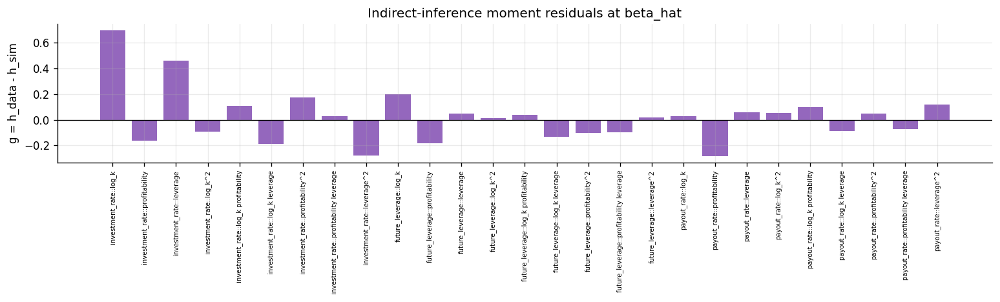

In [10]:
# SMM reports the level error e = h_sim - h_data; the doc's moment is g = h_data - h_sim.
e = ii_result.stage2.moment_fit_errors
h_sim = h_data + e
moment_fit = pd.DataFrame({
    "moment": moment_names,
    "h_data": h_data,
    "h_sim": h_sim,
    "g": h_data - h_sim,
})
print(moment_fit.round(4).to_string(index=False))

fig, ax = plt.subplots(figsize=(13, 4))
ax.bar(np.arange(len(moment_names)), moment_fit["g"], color="tab:purple")
ax.axhline(0.0, color="black", linewidth=0.8)
ax.set_xticks(np.arange(len(moment_names)))
ax.set_xticklabels(moment_names, rotation=90, fontsize=6)
ax.set_ylabel("g = h_data - h_sim")
ax.set_title("Indirect-inference moment residuals at beta_hat")
fig.tight_layout()
plt.show()

saved outputs/notebooks/10_nikolov_to_policy_pipeline/BASE/to_ii_policy_overlay.png


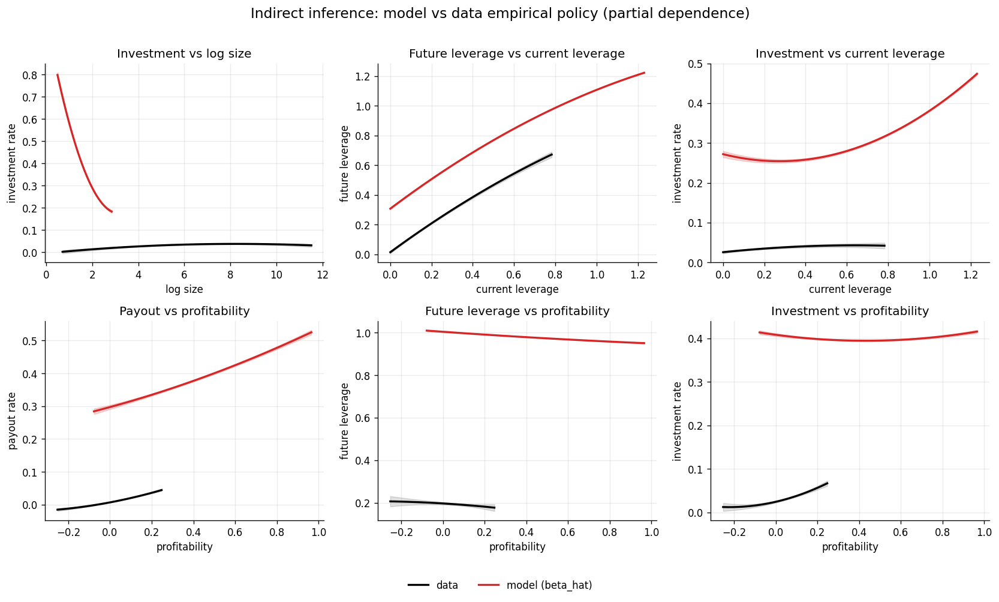

In [11]:
# Re-solve at beta_hat via the SAME builder, simulate one panel, and overlay the
# fitted partial-dependence curves on real data and model simulation.
beta_hat = ii_result.beta_hat
params_hat = build_nikolov_params(beta_hat, ii_cfg)
to_hat = solve_nikolov_to(build_nikolov_grid_config(beta_hat, ii_cfg), params_hat)
hat_sim_cfg = NikolovTOSimulationConfig(
    n_firms=II_RUN_KWARGS["n_firms"],
    horizon=II_RUN_KWARGS["horizon"],
    burn_in=II_RUN_KWARGS["burn_in"],
    seed=SEED,
    default_restart=True,
)
sim_obs_hat = construct_to_observables(simulate_nikolov_to_panel(to_hat, params_hat, hat_sim_cfg))
real_obs = real_panel

fit_sim_hat = fit_empirical_policy(sim_obs_hat, POLICY_X_COLS, POLICY_Y_COLS, AUX_CONFIG)
fit_real = fit_empirical_policy(real_obs, POLICY_X_COLS, POLICY_Y_COLS, AUX_CONFIG)
pd_sim = partial_dependence_slices(fit_sim_hat, sim_obs_hat, POLICY_X_COLS, ci_level=0.95)
pd_real = partial_dependence_slices(fit_real, real_obs, POLICY_X_COLS, ci_level=0.95)

fig, axes = plt.subplots(2, 3, figsize=(14, 8.4))
for ax, (y_col, x_col, title) in zip(axes.ravel(), comparative_statics):
    s = pd_sim[x_col]
    d = pd_real[x_col]
    ax.fill_between(d[x_col], d[f"{y_col}_lower"], d[f"{y_col}_upper"], color="black", alpha=0.12)
    ax.plot(d[x_col], d[y_col], color="black", linewidth=2, label="data")
    ax.fill_between(s[x_col], s[f"{y_col}_lower"], s[f"{y_col}_upper"], color="tab:red", alpha=0.18)
    ax.plot(s[x_col], s[y_col], color="tab:red", linewidth=2, label="model (beta_hat)")
    ax.set_title(title)
    ax.set_xlabel(state_labels[x_col])
    ax.set_ylabel(action_labels[y_col])

handles, labels = axes.ravel()[0].get_legend_handles_labels()
fig.suptitle("Indirect inference: model vs data empirical policy (partial dependence)", fontsize=14)
fig.tight_layout(rect=(0, 0.06, 1, 0.97))
fig.legend(handles, labels, loc="lower center", ncol=len(labels), bbox_to_anchor=(0.5, 0.0), frameon=False)
save_figure(fig, II_OVERLAY_FIGURE_PATH)
plt.show()

In [12]:
# Persist every II artefact so nothing is lost on a long BASE run.
est_table.to_csv(II_RESULT_PATH, index=False)
moment_fit.to_csv(OUTPUT_DIR / "indirect_inference_moments.csv", index=False)

# Scalar run diagnostics (only these are otherwise printed, not saved).
ii_summary = pd.DataFrame([
    dict(metric="profile", value=PROFILE_NAME),
    dict(metric="runtime_seconds", value=round(float(ii_runtime), 2)),
    dict(metric="n_params", value=len(ii_cfg.param_names)),
    dict(metric="n_moments", value=len(moment_names)),
    dict(metric="two_step", value=II_TWO_STEP),
    dict(metric="compute_standard_errors", value=II_COMPUTE_SE),
    dict(metric="n_sim_panels", value=ii_run_config.n_sim_panels),
    dict(metric="global_method", value=ii_run_config.global_method),
    dict(metric="optimizer_maxiter", value=ii_run_config.optimizer_maxiter),
    dict(metric="stage1_objective", value=float(ii_result.stage1.objective)),
    dict(metric="stage1_optimizer_success", value=bool(ii_result.stage1.optimizer_success)),
    dict(metric="stage1_optimizer_nfev", value=int(ii_result.stage1.optimizer_nfev)),
    dict(metric="stage2_objective", value=float(ii_result.stage2.objective)),
    dict(metric="stage2_optimizer_nfev", value=int(ii_result.stage2.optimizer_nfev)),
    dict(metric="omega_condition_number", value=float(ii_result.omega_hat_condition_number)),
    dict(metric="j_statistic", value=float(ii_result.j_statistic)),
    dict(metric="j_p_value", value=float(ii_result.j_p_value)),
    dict(metric="j_df", value=int(ii_result.j_df)),
    dict(metric="j_test_valid", value=bool(ii_result.j_test_valid)),
    dict(metric="simulation_seed", value=str(tuple(ii_result.simulation_seed))),
])
II_SUMMARY_PATH = OUTPUT_DIR / "indirect_inference_summary.csv"
ii_summary.to_csv(II_SUMMARY_PATH, index=False)

# Full result object (jacobian, omega, per-panel moments, traces) for re-analysis.
II_RESULT_PKL_PATH = OUTPUT_DIR / "indirect_inference_result.pkl"
with II_RESULT_PKL_PATH.open("wb") as fh:
    pickle.dump(ii_result, fh)

print(f"saved II estimates: {II_RESULT_PATH.relative_to(REPO_ROOT)}")
print(f"saved II moment fit: {(OUTPUT_DIR / 'indirect_inference_moments.csv').relative_to(REPO_ROOT)}")
print(f"saved II summary: {II_SUMMARY_PATH.relative_to(REPO_ROOT)}")
print(f"saved II result object: {II_RESULT_PKL_PATH.relative_to(REPO_ROOT)}")

saved II estimates: outputs/notebooks/10_nikolov_to_policy_pipeline/BASE/indirect_inference_result.csv
saved II moment fit: outputs/notebooks/10_nikolov_to_policy_pipeline/BASE/indirect_inference_moments.csv
saved II summary: outputs/notebooks/10_nikolov_to_policy_pipeline/BASE/indirect_inference_summary.csv
saved II result object: outputs/notebooks/10_nikolov_to_policy_pipeline/BASE/indirect_inference_result.pkl


## Output Summary

In [13]:
print("TO empirical policy + indirect inference pipeline complete")
print(f"solution: {SOLUTION_PATH.relative_to(REPO_ROOT)}")
print(f"panel: {PANEL_PATH.relative_to(REPO_ROOT)}")
print(f"coefficients: {COEFFICIENT_PATH.relative_to(REPO_ROOT)}")
print(f"policy figure: {FIGURE_PATH.relative_to(REPO_ROOT)}")
if RUN_INDIRECT_INFERENCE:
    print(f"II estimates: {II_RESULT_PATH.relative_to(REPO_ROOT)}")
    print(f"II overlay figure: {II_OVERLAY_FIGURE_PATH.relative_to(REPO_ROOT)}")

TO empirical policy + indirect inference pipeline complete
solution: outputs/notebooks/10_nikolov_to_policy_pipeline/BASE/to_solution.pkl
panel: outputs/notebooks/10_nikolov_to_policy_pipeline/BASE/to_simulated_panel.csv
coefficients: outputs/notebooks/10_nikolov_to_policy_pipeline/BASE/empirical_policy_coefficients.csv
policy figure: outputs/notebooks/10_nikolov_to_policy_pipeline/BASE/to_empirical_policy_slices.png
II estimates: outputs/notebooks/10_nikolov_to_policy_pipeline/BASE/indirect_inference_result.csv
II overlay figure: outputs/notebooks/10_nikolov_to_policy_pipeline/BASE/to_ii_policy_overlay.png
